## Import Dataset

In [21]:
%load_ext tensorboard
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pandarallel import pandarallel

pandarallel.initialize(progress_bar=True)

data = pd.read_csv('fake reviews dataset.csv')
data.head()


INFO: Pandarallel will run on 16 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


,category,rating,label,text_
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor..."
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I..."
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i..."
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
INFO: Pandarallel will run on 16 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


,category,rating,label,text_
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor..."
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I..."
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i..."
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...


In [22]:
data.describe()

,rating
count,40432.000000
mean,4.256579
std,1.144354
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


,rating
count,40432.000000
mean,4.256579
std,1.144354
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


## Tokenized the text

`pandarallel` is a python library for parallelizing your pandas operations. It provides function such as `parallel_apply` to run `apply` in parallel.

In [23]:
from nltk.tokenize import word_tokenize
data['tokenized_text'] = data['text_'].parallel_apply(word_tokenize)

In [24]:
data['text_length'] = data['tokenized_text'].apply(lambda x: len(x))
data.head()

,category,rating,label,text_,tokenized_text,text_length
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor...","[Love, this, !, Well, made, ,, sturdy, ,, and,...",18
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I...","[love, it, ,, a, great, upgrade, from, the, or...",19
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...,"[This, pillow, saved, my, back, ., I, love, th...",16
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i...","[Missing, information, on, how, to, use, it, ,...",19
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...,"[Very, nice, set, ., Good, quality, ., We, hav...",20


,category,rating,label,text_,tokenized_text,text_length
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor...","[Love, this, !, Well, made, ,, sturdy, ,, and,...",18
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I...","[love, it, ,, a, great, upgrade, from, the, or...",19
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...,"[This, pillow, saved, my, back, ., I, love, th...",16
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i...","[Missing, information, on, how, to, use, it, ,...",19
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...,"[Very, nice, set, ., Good, quality, ., We, hav...",20


## Analysis of data

We can see that the most review length are around 24 to 96 length.

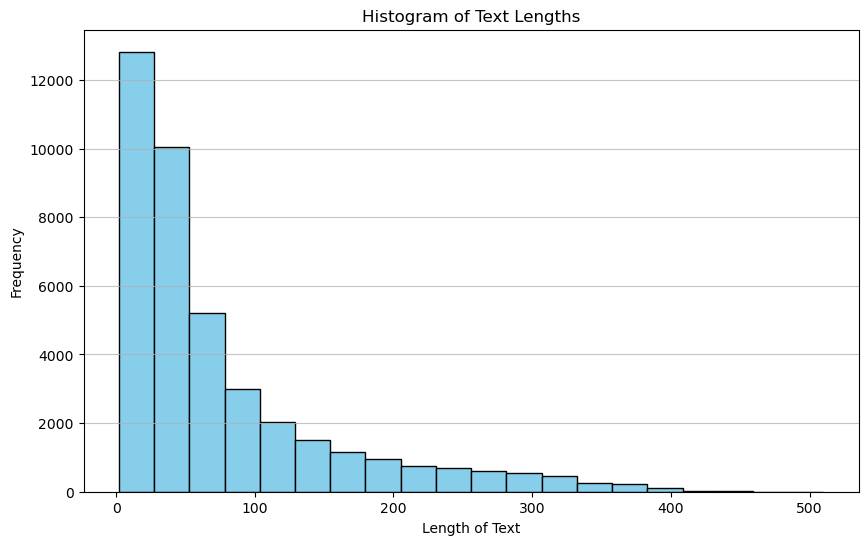

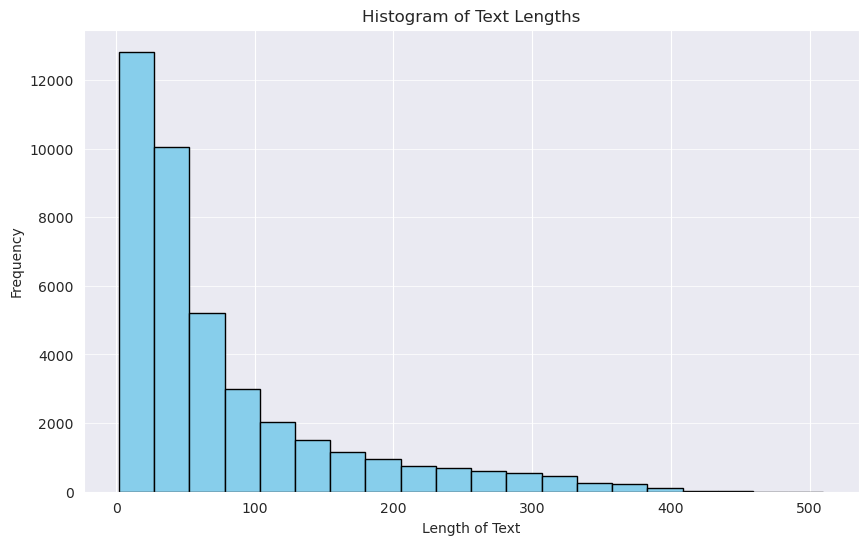

In [25]:
# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(data['text_length'].to_list(), bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Text Lengths')
plt.xlabel('Length of Text')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)

# Display the histogram
plt.show()

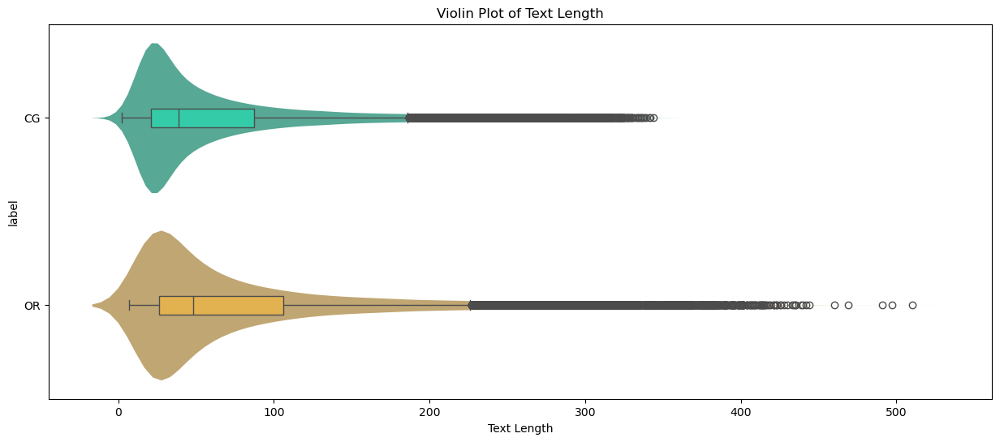

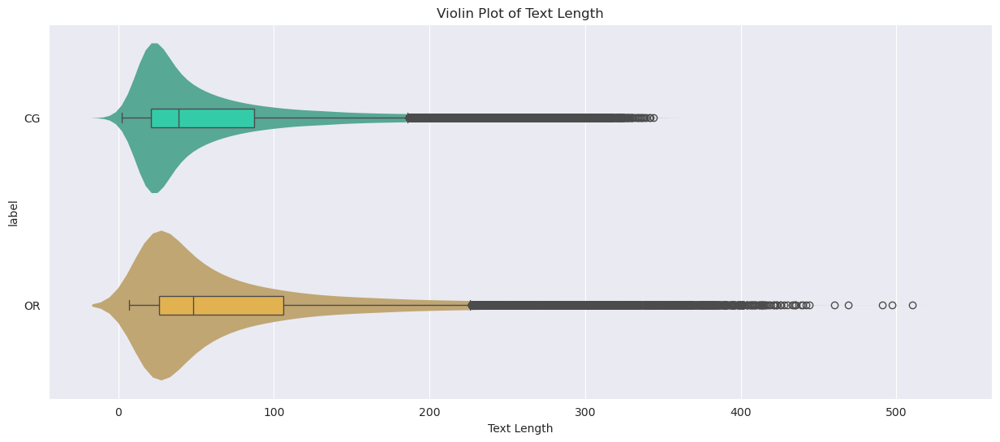

In [26]:
plt.figure(figsize=(15, 6))
ax = sns.violinplot(data, x='text_length', y='label', palette='turbo', inner=None, linewidth=0, saturation=0.4, hue="label")
plt.title('Violin Plot of Text Length')
plt.xlabel('Text Length')
sns.boxplot(data, x='text_length', y='label', palette='turbo', width=0.1,
            boxprops={'zorder': 2}, ax=ax, hue="label")
plt.show()

In [27]:
q1 = np.percentile(data['text_length'], 25)
q3 = np.percentile(data['text_length'], 75)
print("50% of the review length is between {:0.0f}-{:0.0f}".format(q1, q3))

50% of the review length is between 24-96
50% of the review length is between 24-96


## Word Frequency Analysis
Before NLP preprocessing

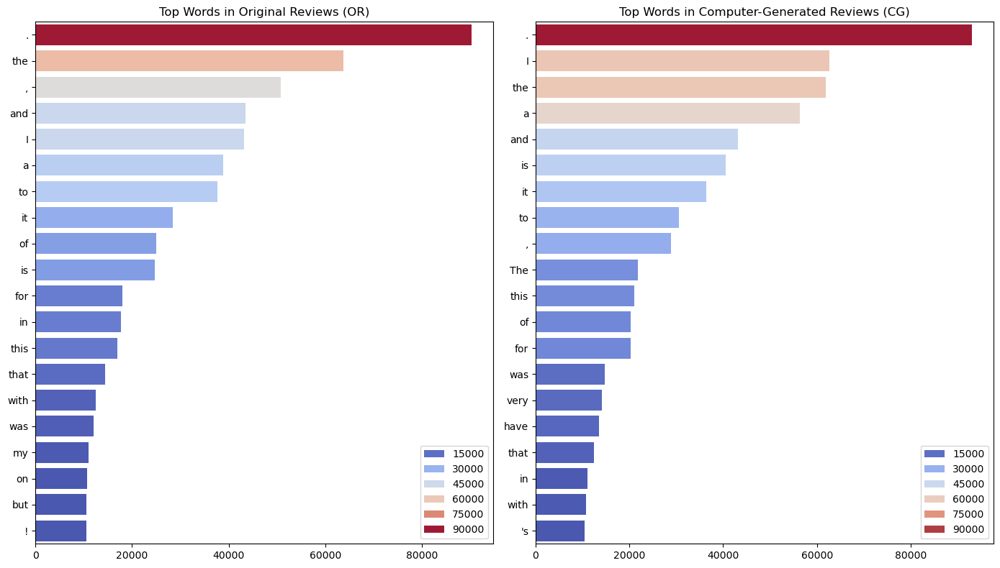

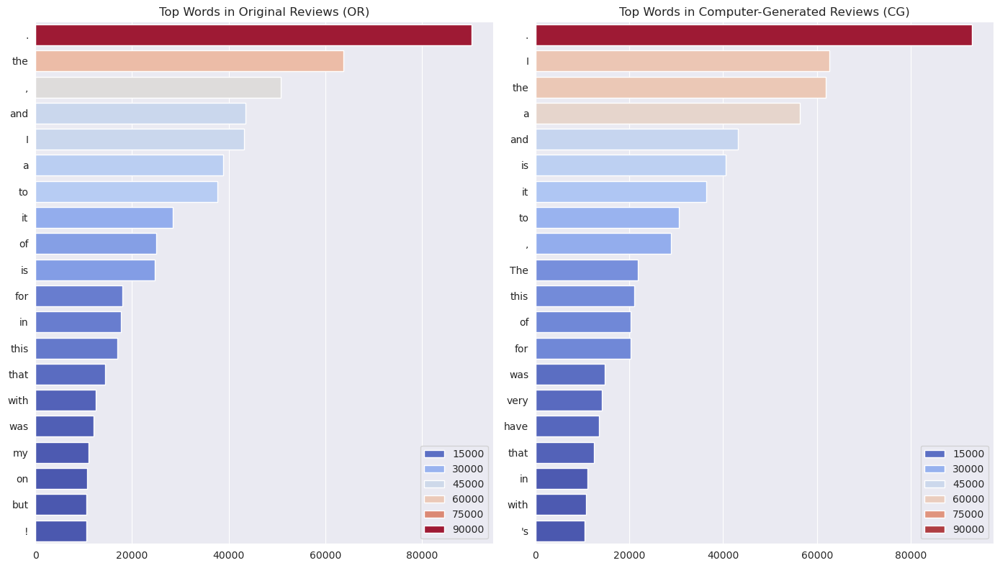

In [28]:
import pandas as pd
from nltk.probability import FreqDist
from itertools import chain

def flatten_words(data):
    return list(chain.from_iterable(data))

def find_common_words_with_freqdist(data):
    # Flatten all words from all columns into a single list
    all_words = flatten_words(data)
    
    # Create a frequency distribution
    freq_dist = FreqDist(all_words)
    return freq_dist

# Separate the OR and CG reviews
or_reviews_text = data[data['label'] == 'OR']['tokenized_text']
or_common_words = find_common_words_with_freqdist(or_reviews_text)

cg_reviews_text = data[data['label'] == 'CG']['tokenized_text']
cg_common_words = find_common_words_with_freqdist(cg_reviews_text)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 8))

# Separating the words and their frequencies for plotting
words, frequencies = zip(*or_common_words.most_common(20))
sns.barplot(x=frequencies, y=words, hue=frequencies, palette="coolwarm", ax=ax1)
ax1.set_title('Top Words in Original Reviews (OR)')

words, frequencies = zip(*cg_common_words.most_common(20))
sns.barplot(x=frequencies, y=words, hue=frequencies, palette="coolwarm", ax=ax2)
ax2.set_title('Top Words in Computer-Generated Reviews (CG)')

plt.tight_layout()
plt.show()


## Word Cloud (OR vs CG)

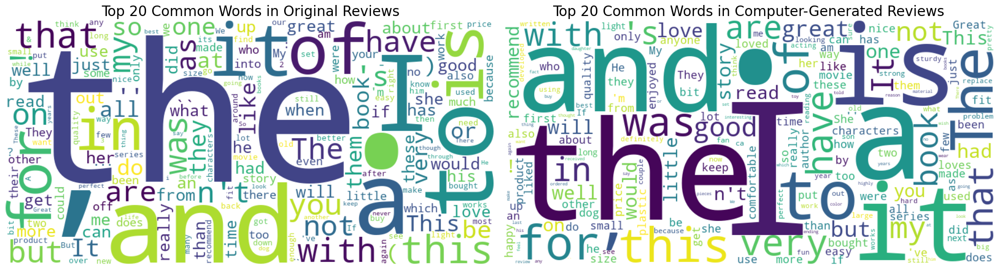

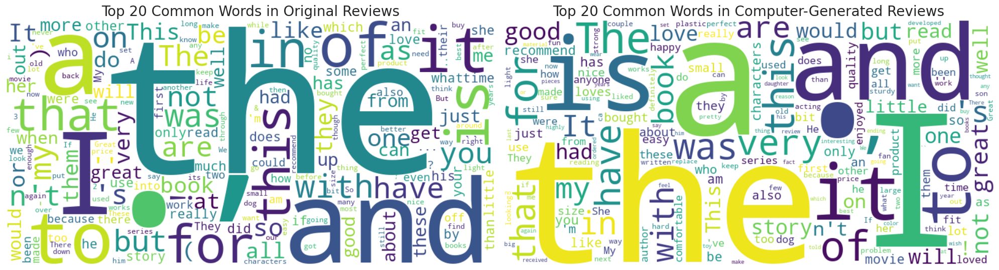

In [29]:
from wordcloud import WordCloud

def display_wordcloud(frequency_distribution, ax):
    wordcloud = WordCloud(width = 800, height = 400, background_color ='white').generate_from_frequencies(frequency_distribution)

    # Display the generated image:
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis("off")

# Display word clouds using the updated function
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].set_title('Top 20 Common Words in Original Reviews', fontsize=20)
display_wordcloud(or_common_words, axes[0])  # For original reviews
axes[1].set_title('Top 20 Common Words in Computer-Generated Reviews', fontsize=20)
display_wordcloud(cg_common_words, axes[1])  # For computer-generated reviews

plt.tight_layout()
plt.show()

## Checking for data imbalance 

We can see from both graphs that the dataset provided has exactly equal number of real and fake reviews across the categories and reviews.

Each category has a comparable number of reviews with only rating having more reviews with a rating of 5.

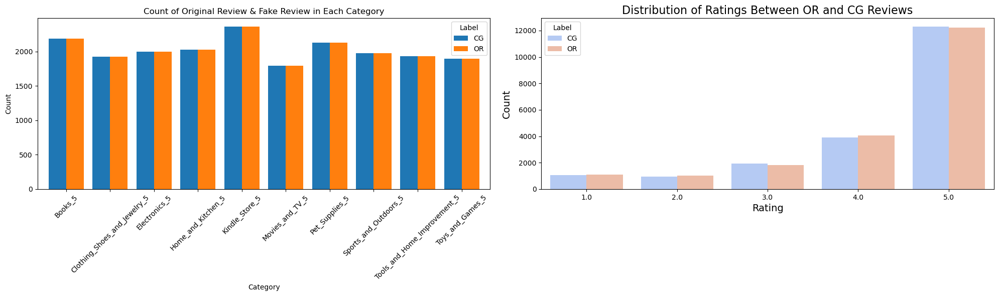

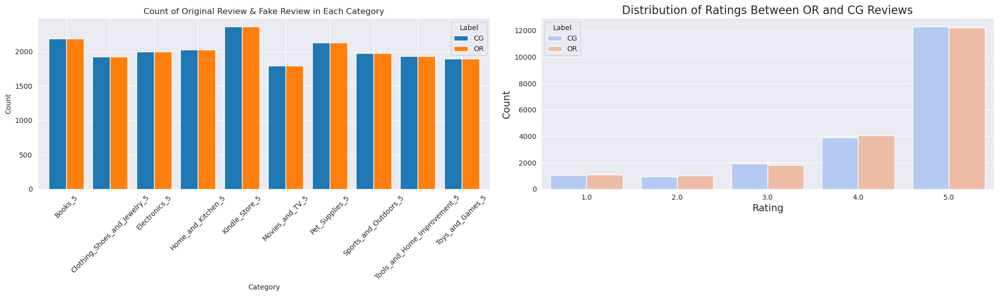

In [30]:
filtered_data = data[data['label'].isin(['CG', 'OR'])]

label_counts = filtered_data.groupby(['category', 'label']).size().unstack(fill_value=0)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Category
label_counts = filtered_data.groupby(['category', 'label']).size().unstack(fill_value=0)
label_counts.plot(kind='bar', ax=ax1, width=0.8)
ax1.set_title('Count of Original Review & Fake Review in Each Category')
ax1.set_xlabel('Category')
ax1.set_ylabel('Count')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
ax1.legend(title='Label')

# Ratings
sns.countplot(x='rating', hue='label', data=data, palette='coolwarm', ax=ax2)
ax2.set_title('Distribution of Ratings Between OR and CG Reviews', fontsize=16)
ax2.set_xlabel('Rating', fontsize=14)
ax2.set_ylabel('Count', fontsize=14)
ax2.legend(title='Label')

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()


## NLP Preprocessing

- Stop words removal
- Stemming
- Lower casing

### Remove Stopwords, Remove punctuation, Convert text to lowercase, Stemming

What is Stemming?
Adapted from https://botpenguin.com/glossary/stemming

![stemming](Stemming.png "Stemming")

In [31]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import string

# nltk.download('punkt')
nltk.download('stopwords')
english_stopwords = set(stopwords.words('english'))
porter = PorterStemmer()

def preprocess_tokenized_text(tokenized_list):
    # Remove punctuation and convert to lowercase
    stripped_tokens = [word.lower().translate(str.maketrans('', '', string.punctuation)) for word in tokenized_list]
    # Apply stemming to each token
    stemmed_tokens = [porter.stem(word) for word in stripped_tokens]
    # Remove stopwords and any empty strings left from stripping punctuation
    return [word for word in stemmed_tokens if word and word not in english_stopwords]

data['tokenized_text_without_stopwords'] = data['tokenized_text'].parallel_apply(preprocess_tokenized_text)
data['text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(' '.join)

data.head()

[nltk_data] Downloading package stopwords to /home/ciyfhx/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,category,rating,label,text_,tokenized_text,text_length,tokenized_text_without_stopwords,text_without_stopwords
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor...","[Love, this, !, Well, made, ,, sturdy, ,, and,...",18,"[love, thi, well, made, sturdi, veri, comfort,...",love thi well made sturdi veri comfort love ve...
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I...","[love, it, ,, a, great, upgrade, from, the, or...",19,"[love, great, upgrad, origin, mine, coupl, year]",love great upgrad origin mine coupl year
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...,"[This, pillow, saved, my, back, ., I, love, th...",16,"[thi, pillow, save, back, love, look, feel, th...",thi pillow save back love look feel thi pillow
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i...","[Missing, information, on, how, to, use, it, ,...",19,"[miss, inform, use, great, product, price]",miss inform use great product price
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...,"[Very, nice, set, ., Good, quality, ., We, hav...",20,"[veri, nice, set, good, qualiti, set, two, month]",veri nice set good qualiti set two month


[nltk_data] Downloading package stopwords to /home/ciyfhx/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,category,rating,label,text_,tokenized_text,text_length,tokenized_text_without_stopwords,text_without_stopwords
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor...","[Love, this, !, Well, made, ,, sturdy, ,, and,...",18,"[love, thi, well, made, sturdi, veri, comfort,...",love thi well made sturdi veri comfort love ve...
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I...","[love, it, ,, a, great, upgrade, from, the, or...",19,"[love, great, upgrad, origin, mine, coupl, year]",love great upgrad origin mine coupl year
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...,"[This, pillow, saved, my, back, ., I, love, th...",16,"[thi, pillow, save, back, love, look, feel, th...",thi pillow save back love look feel thi pillow
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i...","[Missing, information, on, how, to, use, it, ,...",19,"[miss, inform, use, great, product, price]",miss inform use great product price
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...,"[Very, nice, set, ., Good, quality, ., We, hav...",20,"[veri, nice, set, good, qualiti, set, two, month]",veri nice set good qualiti set two month


## Word Frequency Analysis after NLP preprocessing

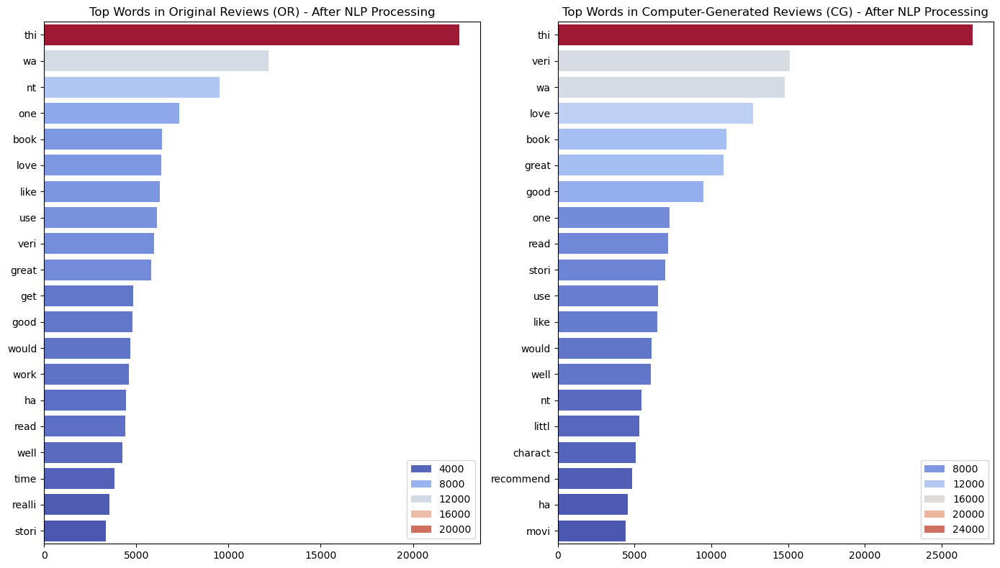

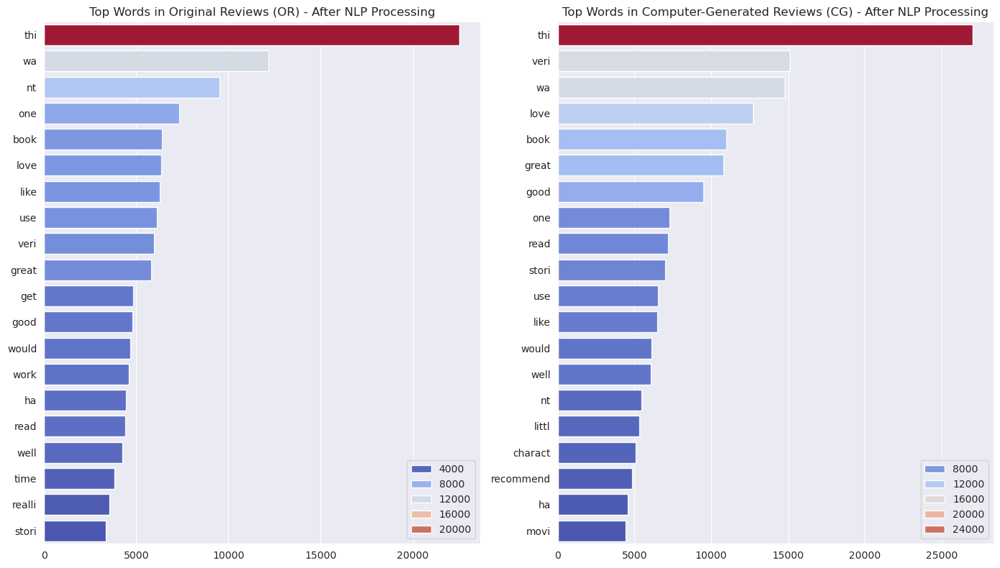

In [32]:
# Separate the OR and CG reviews
or_reviews_text = data[data['label'] == 'OR']['tokenized_text_without_stopwords']
or_common_words = find_common_words_with_freqdist(or_reviews_text)

cg_reviews_text = data[data['label'] == 'CG']['tokenized_text_without_stopwords']
cg_common_words = find_common_words_with_freqdist(cg_reviews_text)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 8))

# Separating the words and their frequencies for plotting
words, frequencies = zip(*or_common_words.most_common(20))
sns.barplot(x=frequencies, y=words, hue=frequencies, palette="coolwarm", ax=ax1)
ax1.set_title('Top Words in Original Reviews (OR) - After NLP Processing')

words, frequencies = zip(*cg_common_words.most_common(20))
sns.barplot(x=frequencies, y=words, hue=frequencies, palette="coolwarm", ax=ax2)
ax2.set_title('Top Words in Computer-Generated Reviews (CG) - After NLP Processing')

plt.tight_layout()
plt.show()

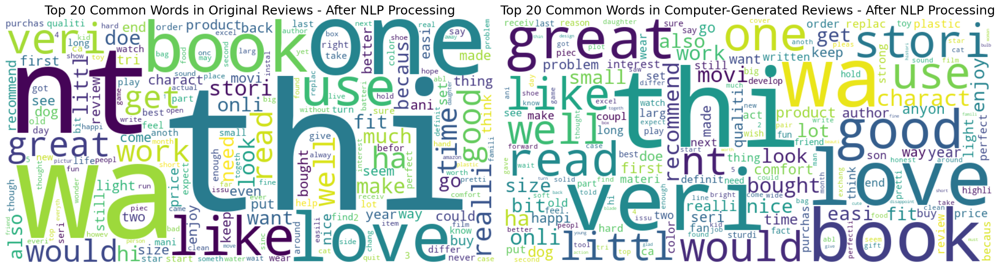

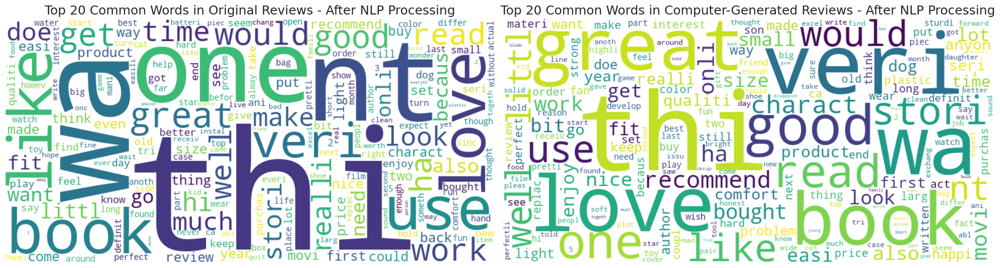

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].set_title('Top 20 Common Words in Original Reviews - After NLP Processing', fontsize=18)
display_wordcloud(or_common_words, axes[0])  # For original reviews
axes[1].set_title('Top 20 Common Words in Computer-Generated Reviews - After NLP Processing', fontsize=18)
display_wordcloud(cg_common_words, axes[1])  # For computer-generated reviews

plt.tight_layout()
plt.show()

## DNN Model

## Using Word2Vec to transform text into vectors

Text will be transform into a fixed-size vector with a dimension of 100

In [34]:
import gensim

vector_dim = 100

model_w2v = gensim.models.Word2Vec(sentences=data['tokenized_text_without_stopwords'], vector_size=vector_dim, window=5, workers=4, min_count=1)

def vectorize_text(text, model_w2v):
    word_vectors = [model_w2v.wv[word] for word in text if word in model_w2v.wv]
    if len(word_vectors) == 0:
        return np.zeros(model_w2v.vector_size)
    else:
        return np.mean(word_vectors, axis=0)
        
data['vectorized_text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(lambda x: vectorize_text(x, model_w2v))
data[['tokenized_text_without_stopwords','vectorized_text_without_stopwords']].head()

,tokenized_text_without_stopwords,vectorized_text_without_stopwords
0,"[love, thi, well, made, sturdi, veri, comfort,...","[0.6714075, -0.40720457, -0.93108547, 0.190591..."
1,"[love, great, upgrad, origin, mine, coupl, year]","[-0.21307082, -0.057372738, -0.9172482, 0.0132..."
2,"[thi, pillow, save, back, love, look, feel, th...","[0.25418535, 0.04120708, -0.92789185, 0.088851..."
3,"[miss, inform, use, great, product, price]","[-0.053747553, -0.3406048, -0.48446965, -0.480..."
4,"[veri, nice, set, good, qualiti, set, two, month]","[0.5295502, -0.3322467, -1.4980693, -0.1463731..."


,tokenized_text_without_stopwords,vectorized_text_without_stopwords
0,"[love, thi, well, made, sturdi, veri, comfort,...","[0.88713616, -0.013676131, -0.8352582, 0.30929..."
1,"[love, great, upgrad, origin, mine, coupl, year]","[-0.22014669, 0.4015512, -0.8352761, 0.3010074..."
2,"[thi, pillow, save, back, love, look, feel, th...","[0.45299736, 0.23392646, -0.60039485, 0.323696..."
3,"[miss, inform, use, great, product, price]","[0.40920004, -0.07570422, -0.3052337, -0.32298..."
4,"[veri, nice, set, good, qualiti, set, two, month]","[0.42969635, 0.03046617, -1.2157892, -0.096898..."


## Convert Category to one-hot encoding

In [35]:
category = pd.get_dummies(data['category']).astype(np.int8)
rating = pd.get_dummies(data['rating']).astype(np.int8)

In [16]:
from sklearn.model_selection import train_test_split

# Prepare data for the neural network
pd.set_option('future.no_silent_downcasting', True)

vectorised_text = np.array(data['vectorized_text_without_stopwords'].tolist())
onehot_encoded_category = category.to_numpy()
onehot_encoded_rating = rating.to_numpy()

X = np.concatenate([onehot_encoded_category, onehot_encoded_rating, vectorised_text], axis=1)
# CG (Fake) - 1
# OR (Real) - 0
y = data['label'].replace('CG', 1).replace('OR', 0).astype('int32').values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print('Training Data: ' + str(X_train))
print('Training Label: ' + str(y_train))

Training Data: [[ 0.          0.          0.         ... -0.04408414  0.67957824
   0.39575726]
 [ 0.          0.          0.         ... -0.07488911  0.97032547
  -0.08751261]
 [ 0.          0.          0.         ... -0.23389105  0.66432101
  -0.06263059]
 ...
 [ 0.          1.          0.         ...  0.36615363  0.31763172
   0.20196517]
 [ 0.          0.          0.         ... -0.45487469  0.25188613
  -0.22031526]
 [ 0.          0.          0.         ...  0.00243811  0.73113006
  -0.4365606 ]]
Training Label: [1 1 1 ... 0 0 1]


## Training the DNN Model

In [38]:
from tensorflow.keras import layers, models
import tensorflow as tf
import os

dnn_model_path = './models/DNN/model_dnn.weights.h5'

# Define the neural network architecture
dnn_model = models.Sequential()
dnn_model.add(layers.Dense(1024, activation='relu', input_shape=(115,)))
dnn_model.add(layers.Dense(512, activation='relu'))
dnn_model.add(layers.Dense(128, activation='relu'))
dnn_model.add(layers.Dense(64, activation='relu'))
dnn_model.add(layers.Dense(1, activation='sigmoid'))
dnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

if os.path.exists(dnn_model_path):
    print("Loading the existing model...")
    dnn_model.load_weights(dnn_model_path)
else:
    print("No existing model found. Creating and training a new one...")

    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs")

    # Train the model
    dnn_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])


# Evaluate the model
loss, accuracy = dnn_model.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy}')

2024-04-14 13:16:16.664169: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-14 13:16:16.688301: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-14 13:16:17.276543: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/ciyfhx/miniforge3/envs/SC1015/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer

Loading the existing model...


/home/ciyfhx/miniforge3/envs/SC1015/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))
I0000 00:00:1713071780.384262   68864 service.cc:145] XLA service 0x7fd58401c910 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1713071780.384293   68864 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-04-14 13:16:20.390427: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-04-14 13:16:20.420001: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
I0000 00:00:1713071781.195476   68935 asm_compiler.cc:369] ptxas warning : Registers are spilled to 

221/253 ━━━━━━━━━━━━━━━━━━━━ 0s 689us/step - accuracy: 0.7895 - loss: 0.5668

I0000 00:00:1713071781.545357   68864 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
I0000 00:00:1713071782.210256   69043 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_31', 260 bytes spill stores, 260 bytes spill loads



253/253 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7898 - loss: 0.5665
Test Accuracy: 0.7915172576904297


/home/ciyfhx/miniforge3/envs/SC1015/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Loading the existing model...


ValueError: A total of 1 objects could not be loaded. Example error message for object <Dense name=dense_5, built=True>:

The shape of the target variable and the shape of the target value in `variable.assign(value)` must match. variable.shape=(261, 1024), Received: value.shape=(115, 1024). Target variable: <KerasVariable shape=(261, 1024), dtype=float32, path=sequential_1/dense_5/kernel>

List of objects that could not be loaded:
[<Dense name=dense_5, built=True>]

## Evaluation scores for DNN Model

253/253 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Precision: 0.7619
Recall: 0.8456
F1 Score: 0.8016
Accuracy: 0.7921


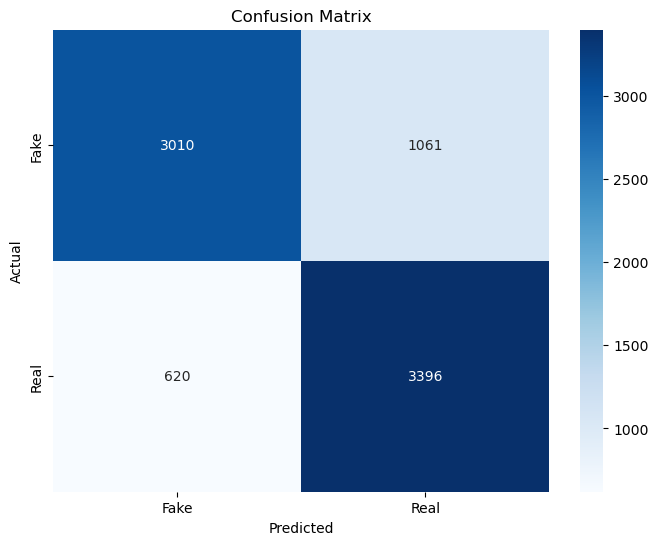

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score,accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Get predictions
y_pred = dnn_model.predict(X_test)
y_pred_sigmoid = tf.keras.activations.sigmoid(y_pred)
# Convert probabilities to binary predictions
y_pred_binary = [1 if p > np.mean(y_pred_sigmoid) else 0 for p in y_pred_sigmoid]

# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Define labels
labels = ['Fake', 'Real']

precision = precision_score(y_test, y_pred_binary)
recall = recall_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
accuracy = accuracy_score(y_test, y_pred_binary)

# Print the evaluation scores
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Accuracy: {accuracy:.4f}')

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## ROC Curve for DNN Model

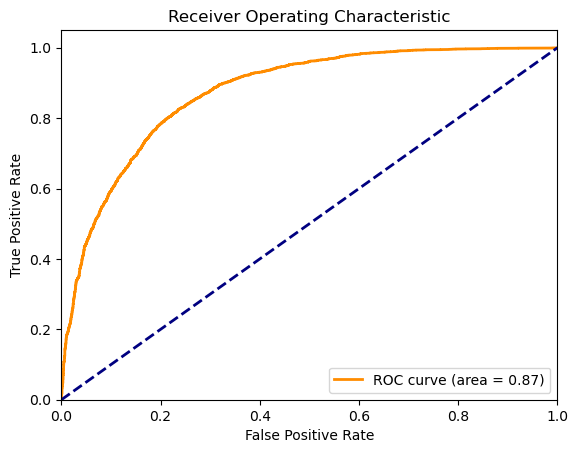

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_test, y_pred_sigmoid)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


## Save DNN Model

In [ ]:
dnn_model.save_weights(dnn_model_path)

# LSTM Model

## Vectorize Text into a variable length 

Instead of transforming text into a fixed-size vector with a fixed dimension, each text will be transform into a matrix with the columns of this matrix representing the vector for each word.

In [ ]:
def vectorize_text_variable_length(text, model_w2v):
    word_vectors = [model_w2v.wv[word] for word in text if word in model_w2v.wv]
    
    if len(word_vectors) == 0:
        return np.zeros((1, model_w2v.vector_size))
    return np.array(word_vectors)

data['vectorized_text_without_stopwords'] = data['tokenized_text_without_stopwords'].parallel_apply(lambda x: vectorize_text_variable_length(x, model_w2v))
data.head()

,category,rating,label,text_,tokenized_text,text_length,tokenized_text_without_stopwords,text_without_stopwords,vectorized_text_without_stopwords
0,Home_and_Kitchen_5,5.0,CG,"Love this! Well made, sturdy, and very comfor...","[Love, this, !, Well, made, ,, sturdy, ,, and,...",18,"[love, thi, well, made, sturdi, veri, comfort,...",love thi well made sturdi veri comfort love ve...,"[[-0.65950257, -0.31978273, -0.84249085, 1.243..."
1,Home_and_Kitchen_5,5.0,CG,"love it, a great upgrade from the original. I...","[love, it, ,, a, great, upgrade, from, the, or...",19,"[love, great, upgrad, origin, mine, coupl, year]",love great upgrad origin mine coupl year,"[[-0.65950257, -0.31978273, -0.84249085, 1.243..."
2,Home_and_Kitchen_5,5.0,CG,This pillow saved my back. I love the look and...,"[This, pillow, saved, my, back, ., I, love, th...",16,"[thi, pillow, save, back, love, look, feel, th...",thi pillow save back love look feel thi pillow,"[[0.8324275, -0.040127065, -0.9823395, 1.04936..."
3,Home_and_Kitchen_5,1.0,CG,"Missing information on how to use it, but it i...","[Missing, information, on, how, to, use, it, ,...",19,"[miss, inform, use, great, product, price]",miss inform use great product price,"[[-0.18225697, 0.9717677, -0.056100294, -0.218..."
4,Home_and_Kitchen_5,5.0,CG,Very nice set. Good quality. We have had the s...,"[Very, nice, set, ., Good, quality, ., We, hav...",20,"[veri, nice, set, good, qualiti, set, two, month]",veri nice set good qualiti set two month,"[[0.42803648, -1.4085352, -2.0470319, -0.75924..."


## Padding Sequences
To ensure that LSTM can process the input tensor during training, it's necessary to pad the input matrices so that they all have the same size. This is because TensorFlow requires each batch of data to be of a uniform shape. However, for inference, TensorFlow can handle inputs of variable sizes, allowing more flexibility.

*Note: For simplification in training the LSTM model, categorical variables and ratings have been excluded.*

In [ ]:
from keras.preprocessing.sequence import pad_sequences

# Prepare data for the neural network
pd.set_option('future.no_silent_downcasting', True)
X = (data['vectorized_text_without_stopwords'].to_numpy())
max_sequence_length = max(len(x) for x in X)

# We need to pad the input because each matrix has variable columns size, so Tensorflow will accept the input tensor.
# This is for training only. For inferencing we can still use variable size
X = pad_sequences(X, maxlen=max_sequence_length, padding='post', dtype='float32')

# CG (Fake) - 1
# OR (Real) - 0
y = data['label'].replace('CG', 1).replace('OR', 0).astype('int32').values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print('Training Data: ' + str(X_train))
print('Training Label: ' + str(y_train))

Training Data: [[[ 1.68952525e+00 -7.17720017e-02 -4.32461500e-01 ...  4.55775023e-01
    1.08208454e+00  1.20189238e+00]
  [ 7.56600857e-01  3.47433425e-02 -4.51231956e-01 ... -1.12091139e-01
    8.31089318e-01  1.77697986e-01]
  [-1.15838982e-01 -1.61274016e+00 -1.06777453e+00 ... -1.30869246e+00
    1.19060957e+00 -1.01230848e+00]
  ...
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
    0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
    0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
    0.00000000e+00  0.00000000e+00]]

 [[-8.21443021e-01 -1.10533845e+00 -7.75615824e-03 ... -1.11136802e-01
    1.45307469e+00  1.73987672e-01]
  [-8.89343381e-01  8.67805541e-01 -1.15177348e-01 ... -1.02534086e-01
    4.85875010e-01  4.62607056e-01]
  [-6.28626406e-01 -2.23523527e-01  5.14830947e-01 ... -6.03818059e-01
    1.94865435e-01  1.49519563e-01]
  ...
  [ 0.00

## Training the LSTM Model

In [ ]:
from keras.models import Model
from keras.layers import Input, LSTM, Dense

lstm_model_path = './models/LSTM/model_lstm.weights.h5'

encoder_inputs = Input(shape=(None, 100))
encoder = LSTM(128)(encoder_inputs)
encoder_outputs = Dense(1, activation='sigmoid')(encoder) 
model_lstm = Model(inputs=encoder_inputs, outputs=encoder_outputs)
model_lstm.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

if os.path.exists(lstm_model_path):
    print("Loading the existing model...")
    model_lstm.load_weights(lstm_model_path)
else:
    print("No existing model found. Creating and training a new one...")

    # Train the model
    model_lstm.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])

# Evaluate the model
loss, accuracy = model_lstm.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy}')

Loading the existing model...


/home/ciyfhx/miniforge3/envs/SC1015/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


253/253 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8556 - loss: 0.3287
Test Accuracy: 0.8500061631202698


## Evaluation scores for LSTM Model

253/253 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Precision: 0.8487
Recall: 0.8506
F1 Score: 0.8496
Accuracy: 0.8505


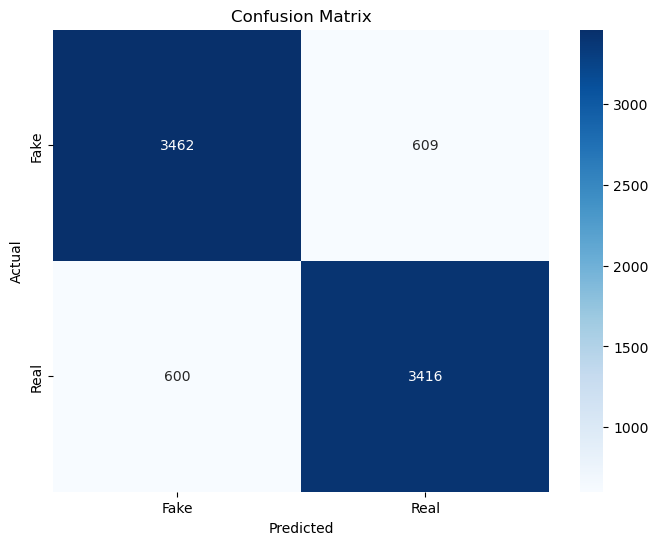

In [ ]:

# Get predictions
y_pred = model_lstm.predict(X_test)
y_pred_sigmoid = tf.keras.activations.sigmoid(y_pred)
# Convert probabilities to binary predictions
y_pred_binary = [1 if p > np.mean(y_pred_sigmoid) else 0 for p in y_pred_sigmoid]


# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Define labels
labels = ['Fake', 'Real']

precision = precision_score(y_test, y_pred_binary)
recall = recall_score(y_test, y_pred_binary)
f1 = f1_score(y_test, y_pred_binary)
accuracy = accuracy_score(y_test, y_pred_binary)

# Print the evaluation scores
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Accuracy: {accuracy:.4f}')


# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## ROC Curve for LSTM Model

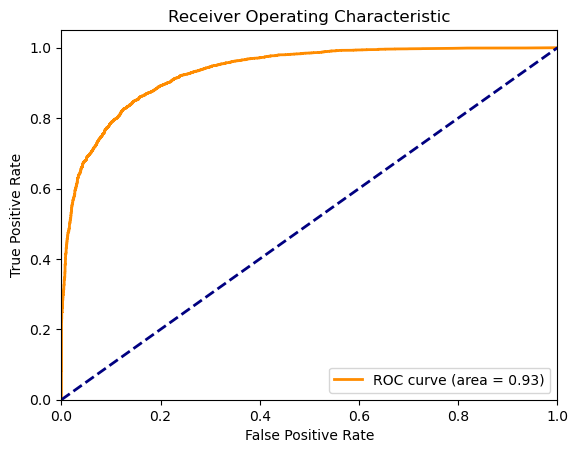

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_sigmoid)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


## Save LSTM Model

In [ ]:
model_lstm.save_weights(lstm_model_path)

## Visualised Tensorboard

In [ ]:
%tensorboard --logdir logs